# Question 5

In [1]:
df <- read.csv('data-p2/encoded_filtered_mimic3d.csv')
# x1 <- scale(df$NumTransfers)
# x2 <- scale(df$NumCallouts)
# x3 <- scale(df$NumProcEvents)
# x4 <- scale(df$NumRx)
x <- model.matrix(~ . - 1, data = df[, !names(df) %in% c('LOSdays')]) 
y <- scale(df$LOSdays)

set.seed(0)

In [2]:
library(MASS)

Warning message:
"package 'MASS' was built under R version 4.4.1"


In [3]:
x_interactions <- model.matrix(~ (. ^ 2) - 1, data = as.data.frame(x))
full_model_with_interactions <- lm(y ~ ., data = as.data.frame(x_interactions))
summary_interactions <- summary(full_model_with_interactions)
summary_interactions


Call:
lm(formula = y ~ ., data = as.data.frame(x_interactions))

Residuals:
    Min      1Q  Median      3Q     Max 
-2.8962 -0.2412  0.0000  0.2102  6.8858 

Coefficients: (379 not defined because of singularities)
                                                                                      Estimate
(Intercept)                                                                         -7.341e+00
gender                                                                               5.256e+00
age                                                                                  2.152e+00
religion                                                                            -1.412e+00
NumCallouts                                                                          1.993e+02
NumDiagnosis                                                                        -2.651e+00
NumProcs                                                                             2.621e+01
NumCPTevents           

In [6]:
length(x_interactions)

[1] 5812128

In [43]:
# Use alias() to check for aliased coefficients
alias_info <- alias(full_model_with_interactions)

# Print the alias information
# print(alias_info)
# Get aliased variables (linear combinations)
aliased_vars <- rownames(alias_info$Complete)
aliased_vars <- gsub("`", "", aliased_vars)
length(aliased_vars)

[1] 379

In [44]:


# Drop aliased variables from x_matrix
x_clean <- x_interactions[, !colnames(x_interactions) %in% aliased_vars]
ncol(x_clean)


[1] 1574

In [47]:
# Refit the model without the aliased variables
full_model_clean <- lm(y ~ ., data = as.data.frame(x_clean))

# Check the summary of the new model
summary(full_model_clean)



Call:
lm(formula = y ~ ., data = as.data.frame(x_clean))

Residuals:
    Min      1Q  Median      3Q     Max 
-2.8962 -0.2412  0.0000  0.2102  6.8858 

Coefficients:
                                                                      Estimate
(Intercept)                                                         -7.341e+00
gender                                                               5.256e+00
age                                                                  2.152e+00
religion                                                            -1.412e+00
NumCallouts                                                          1.993e+02
NumDiagnosis                                                        -2.651e+00
NumProcs                                                             2.621e+01
NumCPTevents                                                         1.411e+02
NumInput                                                             1.015e+00
NumLabs                                    

# IMPORTANT

to try - numtransfers, numcallouts, interaction of each with admitlocation (only interaction, not var itself); interaction between numdiagnosis and numrx? maybe procs and procevents

In [52]:
summary_clean <- summary(full_model_clean)
coefficients <- summary_clean$coefficients
significant_vars <- rownames(coefficients)[coefficients[, "Pr(>|t|)"] < 0.0005]

# Print the significant variables
print(significant_vars)

 [1] "NumCallouts"                                             
 [2] "NumProcs"                                                
 [3] "NumProcEvents"                                           
 [4] "NumTransfers"                                            
 [5] "`gender:AdmitProcedure_6`"                               
 [6] "`age:AdmitDiagnosis_4`"                                  
 [7] "`NumCallouts:admit_location_CLINIC.REFERRAL.PREMATURE`"  
 [8] "`NumCallouts:admit_location_EMERGENCY.ROOM.ADMIT`"       
 [9] "`NumCallouts:admit_location_PHYS.REFERRAL.NORMAL.DELI`"  
[10] "`NumCallouts:admit_location_TRANSFER.FROM.HOSP.EXTRAM`"  
[11] "`NumDiagnosis:NumRx`"                                    
[12] "`NumProcs:admit_location_CLINIC.REFERRAL.PREMATURE`"     
[13] "`NumProcs:admit_location_EMERGENCY.ROOM.ADMIT`"          
[14] "`NumProcs:admit_location_PHYS.REFERRAL.NORMAL.DELI`"     
[15] "`NumProcs:admit_location_TRANSFER.FROM.HOSP.EXTRAM`"     
[16] "`NumProcs:admit_location_TRANSFER.

In [ ]:
data_for_model <- as.data.frame(cbind(y, x))

# Refit the model with the cleaned predictors
final_model <- lm(new_formula, data = data_for_model)

# Check the summary of the new model
summary(final_model)


Call:
lm(formula = new_formula, data = data_for_model)

Residuals:
    Min      1Q  Median      3Q     Max 
-1.8761 -0.3989 -0.1923  0.1004 15.2909 

Coefficients:
                                           Estimate Std. Error t value Pr(>|t|)
(Intercept)                               0.1132678  0.0411744   2.751  0.00598
NumCallouts                              -1.2258014  0.1227166  -9.989  < 2e-16
NumDiagnosis                             -0.0111804  0.0042440  -2.634  0.00847
NumProcs                                 -0.0484383  0.0095290  -5.083 3.94e-07
NumCPTevents                              0.0974538  0.0161694   6.027 1.88e-09
NumInput                                  0.0024061  0.0003873   6.213 5.92e-10
NumLabs                                  -0.0013215  0.0004194  -3.151  0.00164
NumNotes                                  0.0070288  0.0006448  10.900  < 2e-16
NumRx                                    -0.0104120  0.0020185  -5.158 2.66e-07
NumProcEvents                      

In [ ]:
stepwise_model <- stepAIC(full_model_clean, direction = "both")

# Display the results
summary(stepwise_model)

In [8]:
library(car)

# Check for multicollinearity
vif_values <- vif(full_model_with_interactions)
high_vif_predictors <- names(vif_values[vif_values > 5])

# Print predictors with high multicollinearity
print(high_vif_predictors)

Warning message:
"package 'car' was built under R version 4.4.1"
Loading required package: carData

Warning message:
"package 'carData' was built under R version 4.4.1"


ERROR: Error in vif.default(full_model_with_interactions): there are aliased coefficients in the model


In [7]:
length(coefficients)

[1] 6300

In [36]:
full_model <- lm(y ~ x)

# Perform stepwise regression
stepwise_model <- stepAIC(full_model, direction = "both")

# Display the results
summary(stepwise_model)

Start:  AIC=-438.1
y ~ x

       Df Sum of Sq    RSS    AIC
<none>              2463.8 -438.1
- x    61    511.21 2975.0    1.0



Call:
lm(formula = y ~ x)

Residuals:
    Min      1Q  Median      3Q     Max 
-1.9339 -0.3983 -0.1865  0.1187 15.1453 

Coefficients: (1 not defined because of singularities)
                                            Estimate Std. Error t value
(Intercept)                               -3.372e-01  3.408e-01  -0.989
xgender                                   -3.637e-02  3.555e-02  -1.023
xage                                       2.837e-04  1.456e-03   0.195
xreligion                                 -3.487e-02  3.810e-02  -0.915
xNumCallouts                              -1.198e+00  1.280e-01  -9.359
xNumDiagnosis                             -9.190e-03  4.346e-03  -2.115
xNumProcs                                 -5.095e-02  9.720e-03  -5.242
xNumCPTevents                              9.145e-02  1.657e-02   5.518
xNumInput                                  2.511e-03  4.968e-04   5.053
xNumLabs                                  -1.139e-03  4.285e-04  -2.658
xNumMicroLabs                  

In [38]:
x <- x[, !colnames(x) %in% "TotalNumInteract"]

full_model <- lm(y ~ x)

# Perform stepwise regression
stepwise_model <- stepAIC(full_model, direction = "both")

# Display the results
summary(stepwise_model)

Start:  AIC=-438.1
y ~ x

       Df Sum of Sq    RSS    AIC
<none>              2463.8 -438.1
- x    61    511.21 2975.0    1.0



Call:
lm(formula = y ~ x)

Residuals:
    Min      1Q  Median      3Q     Max 
-1.9339 -0.3983 -0.1865  0.1187 15.1453 

Coefficients:
                                            Estimate Std. Error t value
(Intercept)                               -3.372e-01  3.408e-01  -0.989
xgender                                   -3.637e-02  3.555e-02  -1.023
xage                                       2.837e-04  1.456e-03   0.195
xreligion                                 -3.487e-02  3.810e-02  -0.915
xNumCallouts                              -1.198e+00  1.280e-01  -9.359
xNumDiagnosis                             -9.190e-03  4.346e-03  -2.115
xNumProcs                                 -5.095e-02  9.720e-03  -5.242
xNumCPTevents                              9.145e-02  1.657e-02   5.518
xNumInput                                  2.511e-03  4.968e-04   5.053
xNumLabs                                  -1.139e-03  4.285e-04  -2.658
xNumMicroLabs                             -1.985e-03  2.455e-03  -0.809


In [39]:
model_summary <- summary(stepwise_model)

# Extract coefficients and p-values
coefficients <- model_summary$coefficients

significant_predictors <- rownames(coefficients)[coefficients[, "Pr(>|t|)"] < 0.05]

print(significant_predictors)

 [1] "xNumCallouts"                             
 [2] "xNumDiagnosis"                            
 [3] "xNumProcs"                                
 [4] "xNumCPTevents"                            
 [5] "xNumInput"                                
 [6] "xNumLabs"                                 
 [7] "xNumNotes"                                
 [8] "xNumRx"                                   
 [9] "xNumProcEvents"                           
[10] "xNumTransfers"                            
[11] "xadmit_type_EMERGENCY"                    
[12] "xadmit_location_CLINIC.REFERRAL.PREMATURE"
[13] "xadmit_location_TRANSFER.FROM.HOSP.EXTRAM"
[14] "xadmit_location_TRANSFER.FROM.OTHER.HEALT"
[15] "xadmit_location_TRANSFER.FROM.SKILLED.NUR"
[16] "xinsurance_Medicaid"                      
[17] "xAdmitDiagnosis_5"                        
[18] "xAdmitProcedure_1"                        
[19] "xAdmitProcedure_7"                        


In [42]:
# # Remove "(Intercept)" from the list of predictors
# significant_predictors <- significant_predictors[significant_predictors != "(Intercept)"]

# significant_predictors_clean <- gsub("^x", "", significant_predictors)

# # Recreate the formula
# new_formula <- as.formula(paste("y ~", paste(significant_predictors_clean, collapse = " + ")))

# # Check the new formula
# print(new_formula)


y ~ NumCallouts + NumDiagnosis + NumProcs + NumCPTevents + NumInput + 
    NumLabs + NumNotes + NumRx + NumProcEvents + NumTransfers + 
    admit_type_EMERGENCY + admit_location_CLINIC.REFERRAL.PREMATURE + 
    admit_location_TRANSFER.FROM.HOSP.EXTRAM + admit_location_TRANSFER.FROM.OTHER.HEALT + 
    admit_location_TRANSFER.FROM.SKILLED.NUR + insurance_Medicaid + 
    AdmitDiagnosis_5 + AdmitProcedure_1 + AdmitProcedure_7


In [43]:
data_for_model <- as.data.frame(cbind(y, x))

# Refit the model with the cleaned predictors
final_model <- lm(new_formula, data = data_for_model)

# Check the summary of the new model
summary(final_model)


Call:
lm(formula = new_formula, data = data_for_model)

Residuals:
    Min      1Q  Median      3Q     Max 
-1.8761 -0.3989 -0.1923  0.1004 15.2909 

Coefficients:
                                           Estimate Std. Error t value Pr(>|t|)
(Intercept)                               0.1132678  0.0411744   2.751  0.00598
NumCallouts                              -1.2258014  0.1227166  -9.989  < 2e-16
NumDiagnosis                             -0.0111804  0.0042440  -2.634  0.00847
NumProcs                                 -0.0484383  0.0095290  -5.083 3.94e-07
NumCPTevents                              0.0974538  0.0161694   6.027 1.88e-09
NumInput                                  0.0024061  0.0003873   6.213 5.92e-10
NumLabs                                  -0.0013215  0.0004194  -3.151  0.00164
NumNotes                                  0.0070288  0.0006448  10.900  < 2e-16
NumRx                                    -0.0104120  0.0020185  -5.158 2.66e-07
NumProcEvents                      

In [44]:
x_interactions <- model.matrix(~ (. ^ 2) - 1, data = as.data.frame(x))
full_model_with_interactions <- lm(y ~ ., data = as.data.frame(x_interactions))
summary_interactions <- summary(full_model_with_interactions)
summary_interactions


Call:
lm(formula = y ~ ., data = as.data.frame(x_interactions))

Residuals:
    Min      1Q  Median      3Q     Max 
-2.9388 -0.2487  0.0000  0.2080  6.8236 

Coefficients: (330 not defined because of singularities)
                                                                                      Estimate
(Intercept)                                                                         -6.730e+00
gender                                                                               5.448e+00
age                                                                                  2.179e+00
religion                                                                            -1.460e+00
NumCallouts                                                                          2.019e+02
NumDiagnosis                                                                        -2.464e+00
NumProcs                                                                             2.681e+01
NumCPTevents           

In [45]:

# coefficients <- summary_interactions$coefficients

# # Identify the rows (variables) where the coefficient estimate is NA
# singular_predictors <- rownames(coefficients)[is.na(coefficients[, "Estimate"])]

# # Print the singular predictors (these should be dropped)


character(0)


In [50]:
# # Refit the model using the cleaned x_matrix
# model_with_x_matrix <- lm(y ~ ., data = as.data.frame(x_matrix))

# # Check the summary of the model (optional)
# summary(model_with_x_matrix)



Call:
lm(formula = y ~ ., data = as.data.frame(x_matrix))

Residuals:
    Min      1Q  Median      3Q     Max 
-2.9388 -0.2487  0.0000  0.2080  6.8236 

Coefficients: (331 not defined because of singularities)
                                                                                            Estimate
(Intercept)                                                                               -6.730e+00
`(Intercept)`                                                                                     NA
gender                                                                                     5.448e+00
age                                                                                        2.179e+00
religion                                                                                  -1.460e+00
NumCallouts                                                                                2.019e+02
NumDiagnosis                                                                      

In [52]:
stepwise_model <- stepAIC(model_with_x_matrix, direction = "both")

# View the summary of the final stepwise-selected model
summary(stepwise_model)

Start:  AIC=-995.59
y ~ `(Intercept)` + gender + age + religion + NumCallouts + NumDiagnosis + 
    NumProcs + NumCPTevents + NumInput + NumLabs + NumMicroLabs + 
    NumNotes + NumOutput + NumRx + NumProcEvents + NumTransfers + 
    NumChartEvents + ExpiredHospital + admit_type_EMERGENCY + 
    admit_type_NEWBORN + admit_type_URGENT + admit_location_CLINIC.REFERRAL.PREMATURE + 
    admit_location_EMERGENCY.ROOM.ADMIT + admit_location_HMO.REFERRAL.SICK + 
    admit_location_PHYS.REFERRAL.NORMAL.DELI + admit_location_TRANSFER.FROM.HOSP.EXTRAM + 
    admit_location_TRANSFER.FROM.OTHER.HEALT + admit_location_TRANSFER.FROM.SKILLED.NUR + 
    insurance_Medicaid + insurance_Medicare + insurance_Private + 
    insurance_Self.Pay + marital_status_MARRIED + marital_status_SEPARATED + 
    marital_status_SINGLE + marital_status_UNKNOWN..DEFAULT. + 
    marital_status_WIDOWED + ethnicity_BLACK + ethnicity_HISPANIC + 
    ethnicity_OTHER + ethnicity_UNAVAILABLE + ethnicity_WHITE + 
    AdmitDiagno

: 

In [51]:
alias_info <- alias(model_with_x_matrix)

# Print the alias information
print(alias_info)

Model :
y ~ `(Intercept)` + gender + age + religion + NumCallouts + NumDiagnosis + 
    NumProcs + NumCPTevents + NumInput + NumLabs + NumMicroLabs + 
    NumNotes + NumOutput + NumRx + NumProcEvents + NumTransfers + 
    NumChartEvents + ExpiredHospital + admit_type_EMERGENCY + 
    admit_type_NEWBORN + admit_type_URGENT + admit_location_CLINIC.REFERRAL.PREMATURE + 
    admit_location_EMERGENCY.ROOM.ADMIT + admit_location_HMO.REFERRAL.SICK + 
    admit_location_PHYS.REFERRAL.NORMAL.DELI + admit_location_TRANSFER.FROM.HOSP.EXTRAM + 
    admit_location_TRANSFER.FROM.OTHER.HEALT + admit_location_TRANSFER.FROM.SKILLED.NUR + 
    insurance_Medicaid + insurance_Medicare + insurance_Private + 
    insurance_Self.Pay + marital_status_MARRIED + marital_status_SEPARATED + 
    marital_status_SINGLE + marital_status_UNKNOWN..DEFAULT. + 
    marital_status_WIDOWED + ethnicity_BLACK + ethnicity_HISPANIC + 
    ethnicity_OTHER + ethnicity_UNAVAILABLE + ethnicity_WHITE + 
    AdmitDiagnosis_0 + Admi

In [49]:
# x_matrix <- model.matrix(full_model_with_interactions)

# original_predictors <- colnames(x_interactions)  # Original data
# predictors_in_model <- colnames(x_matrix)  # Predictors in the design matrix

# # Find out which predictors were dropped
# dropped_predictors <- setdiff(original_predictors, predictors_in_model)

# # Print the dropped predictors
# print(dropped_predictors)

   [1] "gender:age"                                                                       
   [2] "gender:religion"                                                                  
   [3] "gender:NumCallouts"                                                               
   [4] "gender:NumDiagnosis"                                                              
   [5] "gender:NumProcs"                                                                  
   [6] "gender:NumCPTevents"                                                              
   [7] "gender:NumInput"                                                                  
   [8] "gender:NumLabs"                                                                   
   [9] "gender:NumMicroLabs"                                                              
  [10] "gender:NumNotes"                                                                  
  [11] "gender:NumOutput"                                                                 

In [3]:
likehd <- function(param){
  param <- as.numeric(param)
  a1 = param[1]
  a2 = param[2]
  b = param[3]
  sd = param[4]

  pred = as.numeric(x1 * a1 + x2 * a2) + b

  # if (sd <= 0) {
  #   return(-Inf)  # Invalid standard deviation, return -Inf
  # }

  singlelikelihoods = dnorm(y, mean = pred, sd = sd, log = TRUE)
  sumll = sum(singlelikelihoods)
  

  # print(paste("Log-likelihood:", sumll))
  
  return(sumll)
}

In [22]:
summary(lm(y~x1+x2))


Call:
lm(formula = y ~ x1 + x2 * x3)

Residuals:
    Min      1Q  Median      3Q     Max 
-0.9871 -0.4775 -0.2051  0.0889 15.6124 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) -0.002037   0.017860  -0.114    0.909    
x1          -0.174857   0.018189  -9.613   <2e-16 ***
x2          -0.196499   0.019325 -10.168   <2e-16 ***
x3          -0.021649   0.025390  -0.853    0.394    
x2:x3        0.025693   0.032510   0.790    0.429    
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.9641 on 2971 degrees of freedom
Multiple R-squared:  0.07172,	Adjusted R-squared:  0.07047 
F-statistic: 57.39 on 4 and 2971 DF,  p-value: < 2.2e-16


In [6]:
prior <- function(param, lambda = 1) {
  param <- as.numeric(param)
  a1 <- param[1]
  a2 <- param[2]
  b <- param[3]
  sd <- param[4]

  # Jeffrey's prior for coefficient
  a1prior <- sum(-log(abs(a1)))
  a2prior <- sum(-log(abs(a2)))

  # Jeffrey's prior for intercept
  bprior <- sum(-log(abs(b)))

  # if (sd <= 0) {
  #   return(-Inf)  # Invalid sd, return -Inf
  # }

  # Exponential prior for standard deviation
  sdprior <- dexp(sd, rate = lambda, log = TRUE)


  # Debug: Print log-prior values
  print(paste("Prior a1:", a1prior, "a2:",a2prior, "b:", bprior, "sd:", sdprior))

  return(a1prior + a2prior + bprior + sdprior)
}

In [18]:
posterior <- function(param){
return (likehd(param) + prior(param))
}


In [19]:
proposalfunction <- function(param){ 
  proposal <- rnorm(3, mean = param[1:3], sd = rep(0.01, 3))  # Propose for the first 3 parameters
  proposal_sd <- abs(rnorm(1, mean = param[4], sd = 0.01))     # Half-normal for sd (absolute value)
  return(c(proposal, proposal_sd))
}

run_metropolis_MCMC <- function(startvalue, iterations){
  num_params <- length(startvalue)  # Number of parameters based on the starting value
  chain = array(dim = c(iterations + 1, num_params))  # Initialize the chain for the correct number of params
  chain[1,] = startvalue  # Set the initial value of the chain
  
  for (i in 1:iterations){
    proposal = proposalfunction(chain[i,])   # Generate a proposal using the current chain value

    # Debug: print intermediate values to ensure calculations are correct
    print("Calculating posterior for proposal:")
    print(proposal)
    post_proposal <- posterior(proposal)  # Calculate posterior for the proposal
    print(post_proposal)
    
    post_chain <- posterior(chain[i,])  # Calculate posterior for the current chain value
    print(post_chain)
    
    probab <- exp(post_proposal - post_chain)  # Metropolis acceptance criterion
    print(probab)  # Check if probab is calculated properly

    # Ensure probab is a scalar value
    probab <- min(probab, 1)  # Probability should be <= 1

    # Accept or reject the proposal based on the probability
    if (runif(1) < probab){
      chain[i + 1,] = proposal   # Accept the proposal
    } else {
      chain[i + 1,] = chain[i,]  # Reject the proposal, keep the current value
    }
  }
  
  return(chain)  # Return the entire MCMC chain
}

# Generate a starting value with 105 parameters
start_value <- runif(4)  # Random initial values for the parameters

# Run the Metropolis-Hastings MCMC with the starting value and 10,000 iterations
chain <- run_metropolis_MCMC(start_value, 10)

[1] "Calculating posterior for proposal:"
[1] 0.37270925 0.96213159 0.47466475 0.07396102
[1] "Prior a1: 0.986956659373471 a2: 0.0386040548698755 b: 0.745146506106665 sd: -0.0739610205378732"
[1] -752918.1
[1] "Prior a1: 0.999363915571213 a2: 0.0550280370887907 b: 0.732474001011778 sd: -0.101314770756289"
[1] -394762.4
[1] 0
[1] "Calculating posterior for proposal:"
[1] 0.3660557 0.9568923 0.4788636 0.1040379
[1] "Prior a1: 1.00496967178288 a2: 0.0440644456129205 b: 0.736339487171457 sd: -0.10403791472127"
[1] -376954.4
[1] "Prior a1: 0.999363915571213 a2: 0.0550280370887907 b: 0.732474001011778 sd: -0.101314770756289"
[1] -394762.4
[1] Inf
[1] "Calculating posterior for proposal:"
[1] 0.3687490 0.9622988 0.4779218 0.1011685
[1] "Prior a1: 0.997639123621387 a2: 0.0384302874228213 b: 0.738308080859135 sd: -0.101168467401425"
[1] -400883.1
[1] "Prior a1: 1.00496967178288 a2: 0.0440644456129205 b: 0.736339487171457 sd: -0.10403791472127"
[1] -376954.4
[1] 0
[1] "Calculating posterior for 

In [13]:
burnIn = 5000
acceptance = 1-mean(duplicated(chain[-(1:burnIn),]))

In [14]:
print(head(chain[-(1:burnIn), 1]))  # Check the first few values of the chain after burn-in
print(summary(chain[-(1:burnIn), 1]))  # Summary statistics of the chain for parameter a

[1] -0.1392708 -0.1392708 -0.1392708 -0.1392708 -0.1392708 -0.1390526


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-0.2334 -0.1972 -0.1907 -0.1851 -0.1732 -0.1245 


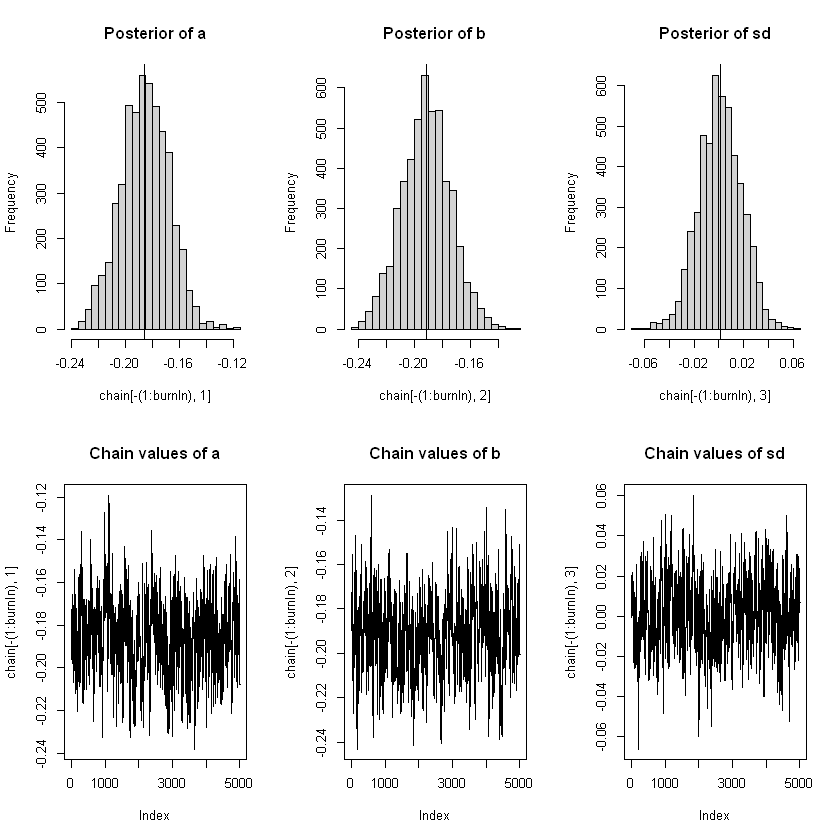

In [19]:
par(mfrow = c(2,3))
hist(chain[-(1:burnIn),1],nclass=30, main="Posterior of a")
abline(v = mean(chain[-(1:burnIn),1]))
# abline(v = t.A, col="red" )
hist(chain[-(1:burnIn),2],nclass=30, main="Posterior of b")
abline(v = mean(chain[-(1:burnIn),2]))
# abline(v = t.B, col="red" )
hist(chain[-(1:burnIn),3],nclass=30, main="Posterior of sd")
abline(v = mean(chain[-(1:burnIn),3]) )
# abline(v = t.sd, col="red" )
plot(chain[-(1:burnIn),1], type = "l", main = "Chain values of a")
# abline(h = t.A, col="red" )
plot(chain[-(1:burnIn),2], type = "l", main = "Chain values of b")
# abline(h = t.B, col="red" )
plot(chain[-(1:burnIn),3], type = "l", main = "Chain values of sd")
# abline(h = t.sd, col="red" )

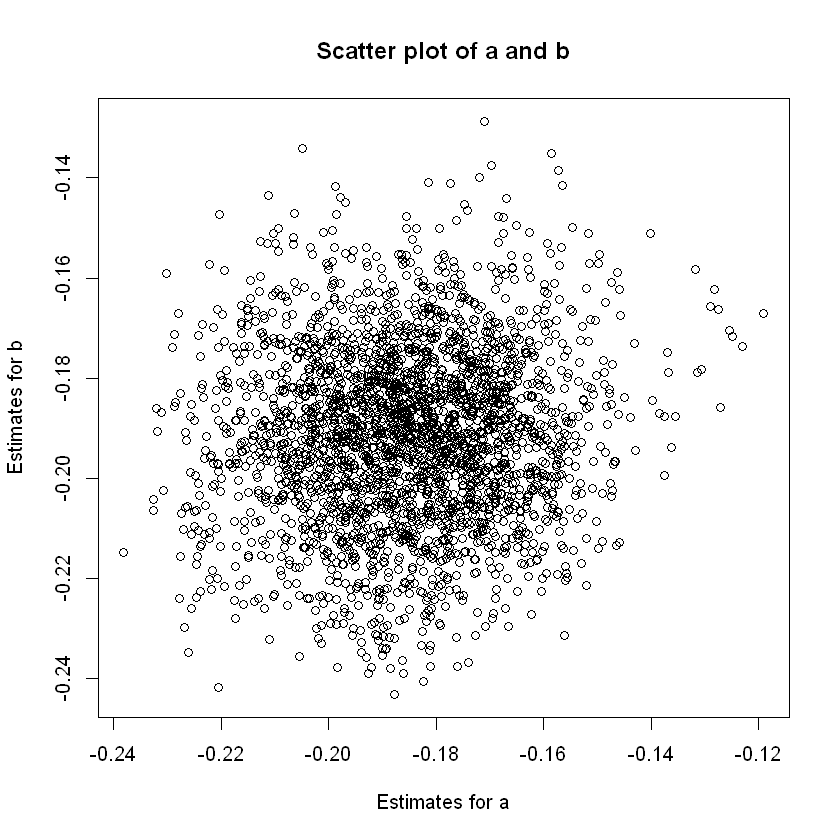

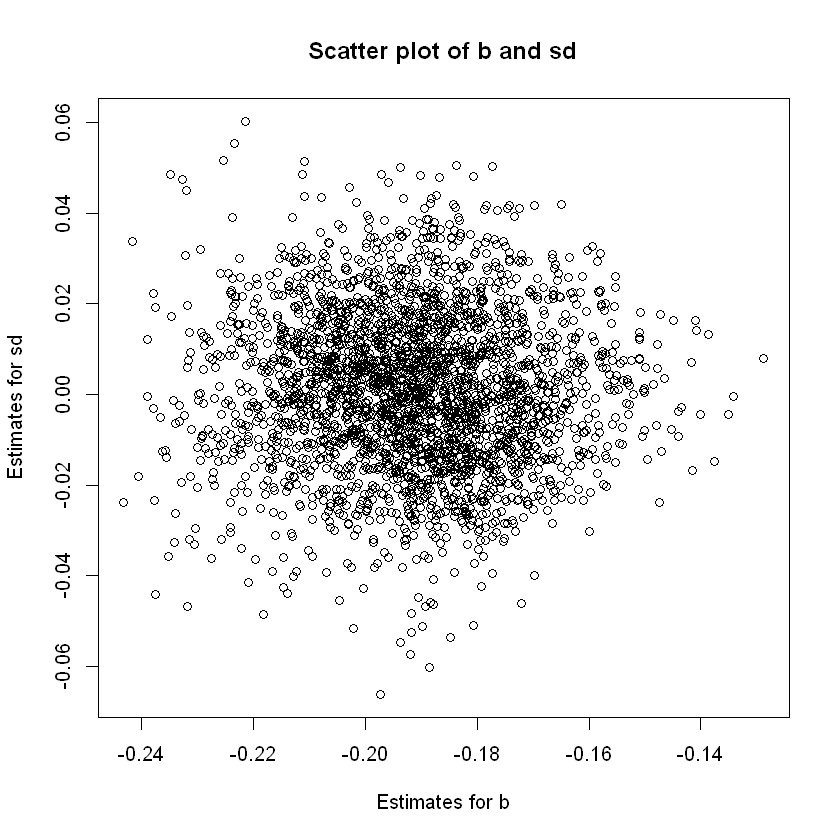

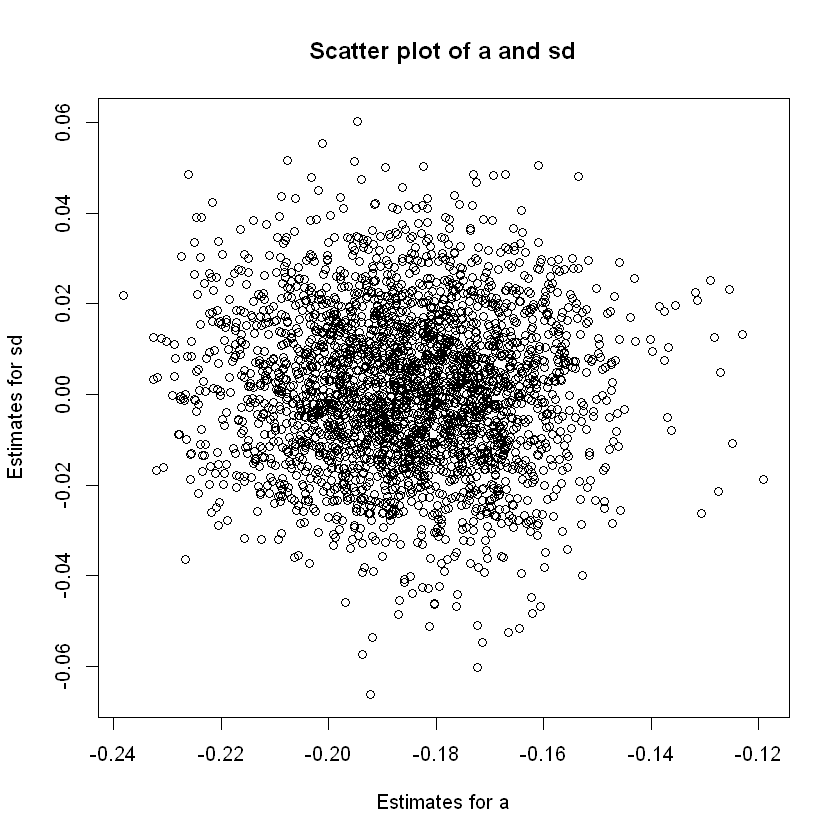

In [20]:
plot(chain[-(1:burnIn),1:2], main="Scatter plot of a and b",
xlab="Estimates for a", ylab="Estimates for b")
# abline(v = t.A, col="red" )
# abline(h = t.B, col="red" )
plot(chain[-(1:burnIn),2:3], main="Scatter plot of b and sd",
xlab="Estimates for b", ylab="Estimates for sd")
# abline(v = t.B, col="red" )
# abline(h = t.sd, col="red" )
plot(chain[-(1:burnIn),c(1,3)], main="Scatter plot of a and sd",
xlab="Estimates for a", ylab="Estimates for sd")
# abline(v = t.A, col="red" )
# abline(h = t.sd, col="red" )

ERROR: Error in eval(predvars, data, env): object 'y' not found
